# <div style='padding:25px;background-color:maroon;color:white;border-radius:4px;font-size:100%;text-align: center'>Banking Data Analysis<br></div>

## <span style="color:Aqua;">Importing libraries from Python</span>

In [1]:
import pandas as pd
pd.options.display.max_columns = 50
pd.set_option("display.precision", 4)
pd.set_option('display.float_format', '{:.4f}'.format)

import numpy as np

import seaborn as sns
sns.set_theme(context='notebook', style='white', palette='dark', font='sans-serif', font_scale=1, color_codes=True, rc=None)
sns.set_style({'axes.facecolor': 'white','axes.edgecolor': 'white'})

import matplotlib.pyplot as plt
plt.rcParams.update({
    'text.color': 'black',  # Change font color
    'axes.labelcolor': 'black',  # Change axis label color
    'xtick.color': 'black',  # Change x-tick color
    'ytick.color': 'black',  # Change y-tick color
    'font.weight': 'bold',  # Change font weight
    'axes.titleweight': 'bold',  # Change title weight
    'axes.labelweight': 'bold',# Change label weight
})


from sklearn.preprocessing import StandardScaler, RobustScaler,MinMaxScaler
from sklearn.model_selection import train_test_split

from sklearn.cluster import KMeans, DBSCAN
from kneed import KneeLocator
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

import pickle



## <span style="color:Aqua;">Reading model dataset:</span>

In [2]:
df = pd.read_feather('model_ready.feather')

In [3]:
df.sample(3)

,num_bank_accounts,num_credit_card,num_of_loan,delay_from_due_date,num_of_delayed_payment,num_credit_inquiries,credit_mix,payment_of_min_amount,payment_behaviour,credit_score,Mortgage Loan,Home Equity Loan,Credit-Builder Loan,Payday Loan,Personal Loan,Debt Consolidation Loan,Student Loan,Auto Loan,credit_inquiry_per_loan,age_group,disposable_income,age_boxcox,annual_income_boxcox,monthly_inhand_salary_boxcox,interest_rate_boxcox,outstanding_debt_square,credit_utilization_ratio_log,credit_history_age_boxcox,changed_credit_limit_cube,total_emi_per_month_square,amount_invested_monthly_boxcox,monthly_balance_boxcox,credit_limit_change_rate_exp,debt_income_ratio_log,loan_income_ratio_month_boxcox,credit_utilization_per_account_boxcox,reliable_payment_boxcox,delayed_payment_ratio_boxcox,investment_to_income_ratio_square,credit_limit_change_rate_boxcox,total_credit_exposure_boxcox,credit_utilization_to_income_ratio_boxcox,savings_rate_rec,income_stability_boxcox,total_liability_boxcox,debt_paytime_log
49715,4,5,0,8,2,2.0000,2,0,5,1,0,0,0,0,0,0,0,0,2.0000,4,11042.7100,15.4022,16.0346,14.1597,3.6669,22.8873,3.5264,197.9677,51,0.0000,9.9021,30.6269,0.4948,10.0095,2.3537,1.0088,-0.5770,0.7704,0.0873,-2.5220,19.2640,-11.5856,131.1264,-0.0068,19.1324,6.2612
62215,3,4,5,27,9,6.0000,1,2,0,1,0,1,1,0,0,0,1,0,1.0000,1,1412.5175,8.9332,12.5292,10.0753,4.3379,30.7909,3.2581,125.3873,87,7.0199,7.7435,17.1342,0.5014,7.4441,1.8121,0.9981,1.6398,0.4311,0.1813,-2.4892,23.4385,-8.4239,30.4060,0.0260,24.0506,2.9368
4820,6,9,6,27,16,14.0000,0,2,1,1,0,0,1,0,1,0,1,1,2.0000,1,1354.9954,8.1014,12.6940,10.0004,8.8126,69.0036,3.5553,101.4618,-29,6.9871,6.6790,17.4122,0.6889,7.0755,1.8044,0.9282,2.8367,0.9380,0.1577,-1.5540,40.1520,-8.1030,40.1759,-0.1096,41.1084,4.5599


## <span style="color:Aqua;">Selecting Features:</span>

### <span style="color:Khaki;">Problem Statement for Customer Segmentation (Clustering):
<span style="color: Chartreuse;">   &#9784; &nbsp;</span> Utilize clustering algorithms to group customers based on their banking behaviors, transaction histories, and demographics. <br>
- Apply clustering algorithms to group policyholders based on similar characteristics and behavior.
- Identify customer segments with common insurance needs and preferences.
- Tailor marketing strategies and product offerings to specific clusters, enhancing customer
engagement and increasing cross-selling opportunities.

### <span style="color:Khaki;">Features for Banking behaviors and transaction histories:

In [4]:
features = ['num_bank_accounts', 'num_credit_card', 'num_of_loan', 'delay_from_due_date',
    'num_of_delayed_payment', 'num_credit_inquiries', 'credit_mix',
    'payment_of_min_amount', 'payment_behaviour', 'credit_score',
    'reliable_payment_boxcox', 'delayed_payment_ratio_boxcox', 
     'total_credit_exposure_boxcox','credit_utilization_to_income_ratio_boxcox', 'savings_rate_rec',
      'debt_paytime_log','interest_rate_boxcox'
]

### <span style="color:Khaki;">Features for Demographics and financial status:

In [5]:
features1 = ['age_boxcox','total_emi_per_month_square','amount_invested_monthly_boxcox','annual_income_boxcox',
             'income_stability_boxcox','total_liability_boxcox','investment_to_income_ratio_square',
             'credit_limit_change_rate_boxcox','outstanding_debt_square']

### <span style="color:Khaki;">Selecting features for modeling:

In [6]:
original_features=['num_bank_accounts', 'num_credit_card', 'num_of_loan', 'delay_from_due_date','num_of_delayed_payment',
     'num_credit_inquiries', 'credit_mix','payment_of_min_amount', 'payment_behaviour', 'credit_score','age_boxcox',
     'total_emi_per_month_square','amount_invested_monthly_boxcox','annual_income_boxcox',]

all_features = ['num_bank_accounts', 'num_credit_card', 'num_of_loan', 'delay_from_due_date',
    'num_of_delayed_payment', 'num_credit_inquiries', 'credit_mix','payment_of_min_amount', 'payment_behaviour',
    'credit_score','reliable_payment_boxcox', 'delayed_payment_ratio_boxcox','total_credit_exposure_boxcox',
    'credit_utilization_to_income_ratio_boxcox', 'savings_rate_rec','debt_paytime_log','interest_rate_boxcox',
    'age_boxcox','total_emi_per_month_square','amount_invested_monthly_boxcox','annual_income_boxcox',
             'income_stability_boxcox','total_liability_boxcox','investment_to_income_ratio_square',
             'credit_limit_change_rate_boxcox','outstanding_debt_square','credit_inquiry_per_loan','changed_credit_limit_cube']

revised_features = ['num_bank_accounts','num_credit_card','num_of_loan','num_of_delayed_payment', 'delay_from_due_date',
                    'num_credit_inquiries', 'credit_mix','payment_of_min_amount', 'payment_behaviour',
                    'credit_score','age_boxcox','total_emi_per_month_square','amount_invested_monthly_boxcox',
                    'annual_income_boxcox','total_liability_boxcox','outstanding_debt_square','savings_rate_rec']

## <span style="color:Aqua;">Splitting data for train_test:</span>

x_train, x_test = train_test_split(df, test_size=None, random_state=42)

## <span style="color:Aqua;">Scaling data:</span>

In [8]:
scaler = MinMaxScaler(feature_range=(-1,1))

original_scaled = scaler.fit_transform(df[original_features].values)
all_scaled = scaler.fit_transform(df[all_features].values)
revised_scaled = scaler.fit_transform(df[revised_features].values)

# x_train_scaled_df = pd.DataFrame(df,columns=df.columns)
# x_train_scaled_df

print(len(original_scaled),len(all_scaled),len(revised_scaled))

100000 100000 100000


## <span style="color:Aqua;">Training the model with all relevant Features:</span>

### <span style="color:Khaki;">Finding K value using Elbow method:

In [9]:
wcss = []

for k in range(1,6):
    kmeans = KMeans(n_clusters=k,init='k-means++')
    kmeans.fit(original_scaled)
    wcss.append(kmeans.inertia_)

print(wcss)

[460143.54792263784, 296141.65400130197, 255469.225859205, 236200.9218784491, 218997.14351050887]


#### <span style="color:Khaki;">Plotting wcss values to find the Elbow:

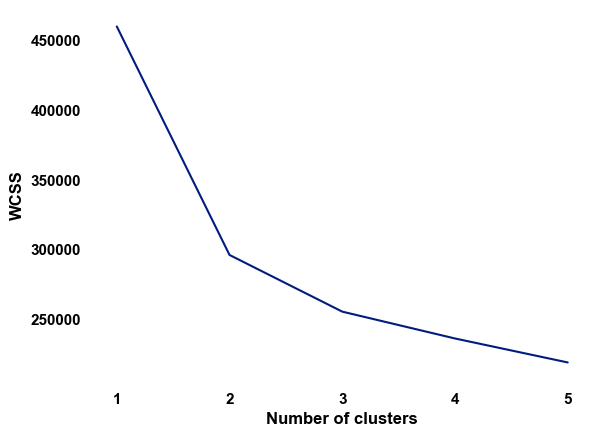

In [10]:
plt.plot(range(1,6),wcss)
plt.xticks(range(1,6))
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

#### <span style="color:Khaki;">Finding knee locator in the Elbow curve:

In [11]:
kl = KneeLocator(range(1,6),wcss,curve='convex',direction="decreasing")
optimal_k_wcss = kl.elbow
optimal_k_wcss

2

### <span style="color:Khaki;">Finding K value using silhouette score method:

In [12]:
silhouette_coefficients = []

for k in range(2,6):
    kmeans = KMeans(n_clusters=k,init='k-means++')
    kmeans.fit(original_scaled)
    score = silhouette_score(original_scaled,kmeans.labels_)
    silhouette_coefficients.append(score)
print(silhouette_coefficients)

[0.3093641888796225, 0.2186221835628736, 0.18959535207514525, 0.15741967088520575]


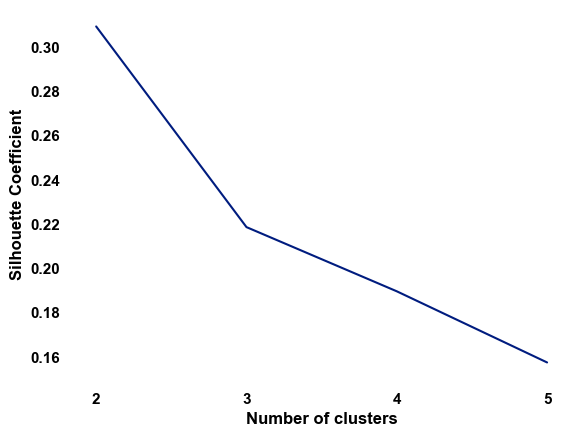

In [13]:
plt.plot(range(2,6),silhouette_coefficients)
plt.xticks(range(2,6))
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Coefficient')
plt.show()

In [14]:
optimal_k_silhouette = silhouette_coefficients.index(max(silhouette_coefficients)) + 2
print(f"Optimal number of clusters (Silhouette): {optimal_k_silhouette}")

Optimal number of clusters (Silhouette): 2


In [15]:
print(f"Optimal number of clusters (WCSS): {optimal_k_wcss}")
print(f"Optimal number of clusters (Silhouette): {optimal_k_silhouette}")

Optimal number of clusters (WCSS): 2
Optimal number of clusters (Silhouette): 2


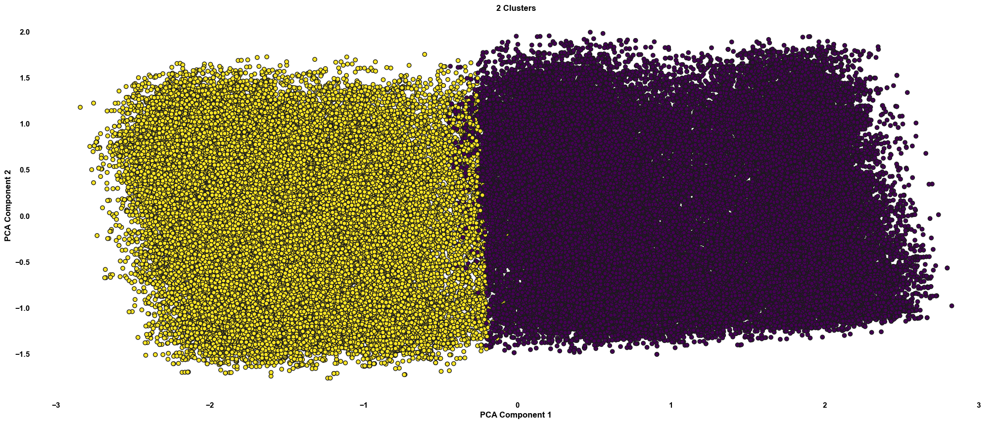

In [16]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Assuming x_train_scaled_df is your original dataset

# Reduce dimensions to 2D for visualization
pca = PCA(n_components=2)
x_pca = pca.fit_transform(original_scaled)

# Fit KMeans with 2 clusters
kmeans_2 = KMeans(n_clusters=2, init='k-means++')
labels_2 = kmeans_2.fit_predict(original_scaled)

# Plot the clusters
plt.figure(figsize=(25, 10))
plt.scatter(x_pca[:, 0], x_pca[:, 1], c=labels_2, cmap='viridis', marker='o', edgecolor='k')
plt.title('2 Clusters')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()

## <span style="color:Aqua;">Training the model with Original Features:</span>

Removed additional features that we created using original features as a part of Feature engineering.

In [17]:
wcss = []

for k in range(1,6):
    kmeans = KMeans(n_clusters=k,init='k-means++')
    kmeans.fit(all_scaled)
    wcss.append(kmeans.inertia_)

print(wcss)

[711881.089560824, 506129.3508149708, 441990.46078189014, 416897.3258560972, 396021.45901851833]


#### <span style="color:Khaki;">Plotting wcss values to find the Elbow:

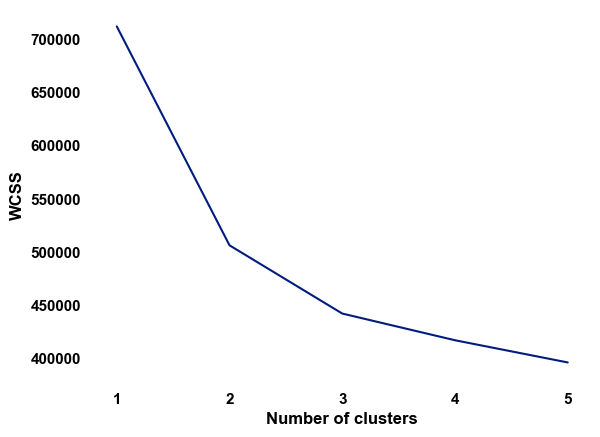

In [18]:
plt.plot(range(1,6),wcss)
plt.xticks(range(1,6))
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

#### <span style="color:Khaki;">Finding knee locator in the Elbow curve:

In [19]:
kl = KneeLocator(range(1,6),wcss,curve='convex',direction="decreasing")
optimal_k_wcss = kl.elbow
optimal_k_wcss

2

### <span style="color:Khaki;">Finding K value using silhouette score method:

In [20]:
silhouette_coefficients = []

for k in range(2,6):
    kmeans = KMeans(n_clusters=k,init='k-means++')
    kmeans.fit(all_scaled)
    score = silhouette_score(all_scaled,kmeans.labels_)
    silhouette_coefficients.append(score)
print(silhouette_coefficients)

[0.2500877914677552, 0.1759911049067792, 0.14727749308264232, 0.12777794035309192]


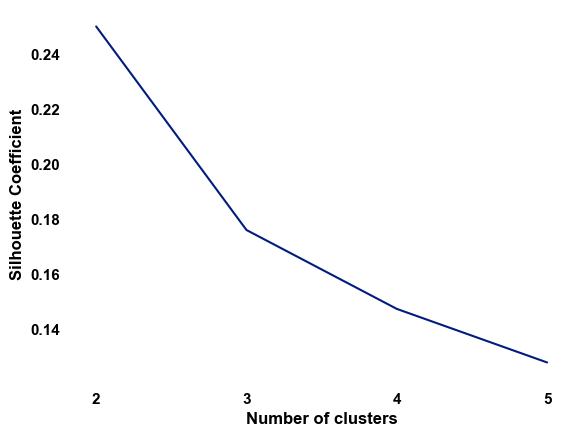

In [21]:
plt.plot(range(2,6),silhouette_coefficients)
plt.xticks(range(2,6))
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Coefficient')
plt.show()

In [22]:
optimal_k_silhouette = silhouette_coefficients.index(max(silhouette_coefficients)) + 2
print(f"Optimal number of clusters (Silhouette): {optimal_k_silhouette}")

Optimal number of clusters (Silhouette): 2


In [23]:
print(f"Optimal number of clusters (WCSS): {optimal_k_wcss}")
print(f"Optimal number of clusters (Silhouette): {optimal_k_silhouette}")

Optimal number of clusters (WCSS): 2
Optimal number of clusters (Silhouette): 2


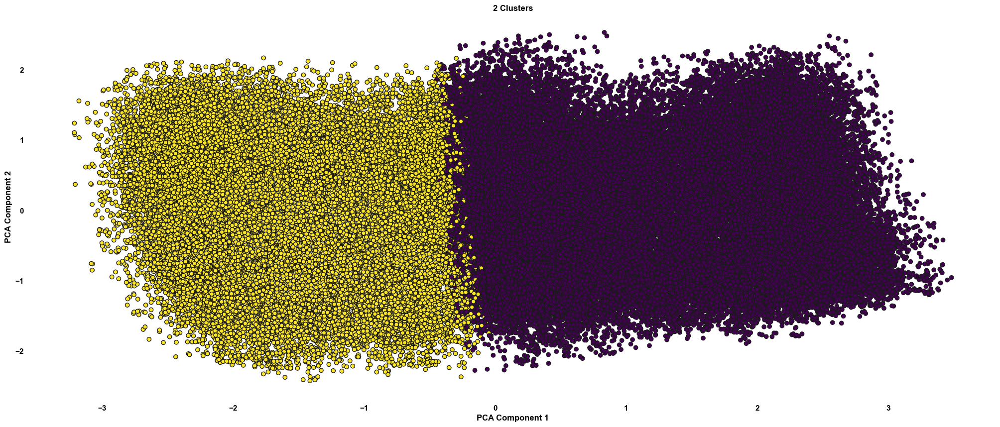

In [24]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Assuming x_train_scaled_df is your original dataset

# Reduce dimensions to 2D for visualization
pca = PCA(n_components=2)
x_pca = pca.fit_transform(all_scaled)

# Fit KMeans with 2 clusters
kmeans_2 = KMeans(n_clusters=2, init='k-means++')
labels_2 = kmeans_2.fit_predict(all_scaled)

# Plot the clusters
plt.figure(figsize=(25, 10))
plt.scatter(x_pca[:, 0], x_pca[:, 1], c=labels_2, cmap='viridis', marker='o', edgecolor='k')
plt.title('2 Clusters')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()

## <span style="color:Aqua;">Training the model with Revised Features:</span>

We have used Original Features plus additional features which seems more relevant to our problem statement.

In [25]:
wcss = []

for k in range(1,6):
    kmeans = KMeans(n_clusters=k,init='k-means++')
    kmeans.fit(revised_scaled)
    wcss.append(kmeans.inertia_)

print(wcss)

[513329.3562822197, 340179.563495921, 289669.2134140404, 271655.85568283877, 252501.76866368667]


#### <span style="color:Khaki;">Plotting wcss values to find the Elbow:

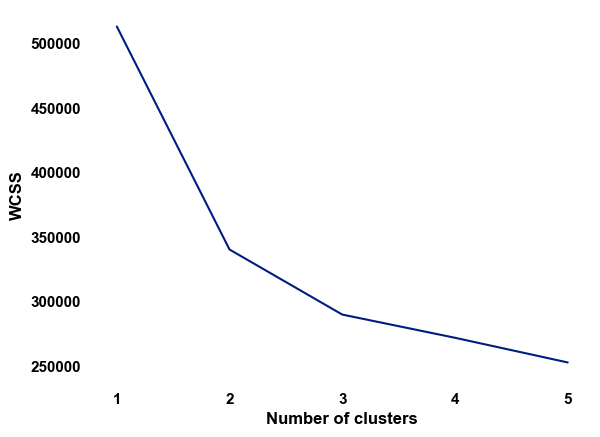

In [26]:
plt.plot(range(1,6),wcss)
plt.xticks(range(1,6))
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

#### <span style="color:Khaki;">Finding knee locator in the Elbow curve:

In [27]:
kl = KneeLocator(range(1,6),wcss,curve='convex',direction="decreasing")
optimal_k_wcss = kl.elbow
optimal_k_wcss

2

### <span style="color:Khaki;">Finding K value using silhouette score method:

In [28]:
silhouette_coefficients = []

for k in range(2,6):
    kmeans = KMeans(n_clusters=k,init='k-means++')
    kmeans.fit(revised_scaled)
    score = silhouette_score(revised_scaled,kmeans.labels_)
    silhouette_coefficients.append(score)
print(silhouette_coefficients)

[0.2909361874435385, 0.21382833503344786, 0.18688218853718275, 0.1560214509194688]


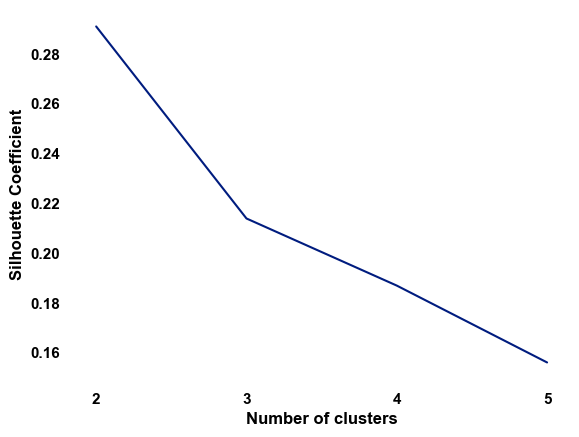

In [29]:
plt.plot(range(2,6),silhouette_coefficients)
plt.xticks(range(2,6))
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Coefficient')
plt.show()

In [30]:
optimal_k_silhouette = silhouette_coefficients.index(max(silhouette_coefficients)) + 2
print(f"Optimal number of clusters (Silhouette): {optimal_k_silhouette}")

Optimal number of clusters (Silhouette): 2


In [31]:
print(f"Optimal number of clusters (WCSS): {optimal_k_wcss}")
print(f"Optimal number of clusters (Silhouette): {optimal_k_silhouette}")

Optimal number of clusters (WCSS): 2
Optimal number of clusters (Silhouette): 2


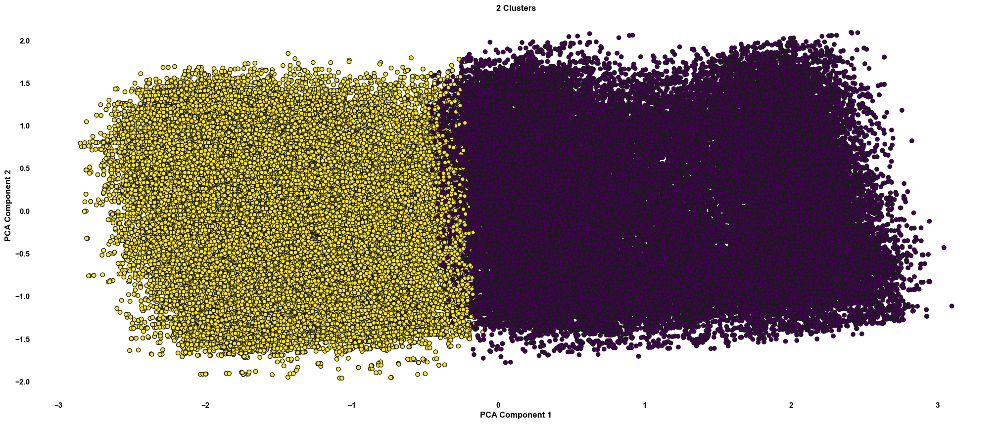

In [32]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Assuming x_train_scaled_df is your original dataset

# Reduce dimensions to 2D for visualization
pca = PCA(n_components=2)
x_pca = pca.fit_transform(revised_scaled)

# Fit KMeans with 2 clusters
kmeans_2 = KMeans(n_clusters=2, init='k-means++')
labels_2 = kmeans_2.fit_predict(revised_scaled)

# Plot the clusters
plt.figure(figsize=(25, 10))
plt.scatter(x_pca[:, 0], x_pca[:, 1], c=labels_2, cmap='viridis', marker='o', edgecolor='k')
plt.title('2 Clusters')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()

## <span style="color:Aqua;">Training the model:</span>


In [13]:
final_eatures = ['num_bank_accounts','num_credit_card','num_of_loan','credit_mix','credit_score','age_boxcox',
                 'annual_income_boxcox','payment_behaviour']

In [33]:
scales = {'std_scale' : StandardScaler(),
'mm_scale' : MinMaxScaler(feature_range=(0,1)),
'rob_scale' : RobustScaler()
}
scaled_dfs = {}
for scaler_name, scaler in scales.items():
    scaled_dfs[scaler_name] = scaler.fit_transform(df[original_features].values)
    print(scaler_name, '---', len(scaled_dfs[scaler_name]))
    
# print([scaler_name for scaler_name in scaled_dfs.keys()])
# print([scaler_df[1] for scaler_df in scaled_dfs.values()])

for scaler_name, scaled_df in scaled_dfs.items():
    print(scaler_name, scaled_df[:1])

std_scale --- 100000
mm_scale --- 100000
rob_scale --- 100000
std_scale [[-0.91343801 -0.74189873  0.19094616 -1.2213467  -1.01218264 -0.4649276
   1.27417057 -1.26372666  0.40945462  1.64667727 -0.94783536 -0.32206698
  -0.99485115 -0.86396218]]
mm_scale [[0.27272727 0.36363636 0.44444444 0.0483871  0.28       0.23529412
  1.         0.         0.6        1.         0.27002413 0.31664311
  0.31710363 0.2921981 ]]
rob_scale [[-0.5        -0.33333333  0.33333333 -0.83333333 -0.77777778 -0.2
   1.         -1.          0.25        1.         -0.59248145 -0.16514373
  -0.70580554 -0.4958076 ]]


In [35]:
silhouette_avg = {}
calinski_harabasz = {}
davies_bouldin = {}
for scaler_name, scaled_df in scaled_dfs.items():
    kmeans = KMeans(n_clusters=2, random_state=42)
    kmeans.fit(scaled_df)
    df['Cluster'] = kmeans.predict(scaled_df)
    silhouette_avg[scaler_name] = silhouette_score(scaled_df, kmeans.labels_)
    calinski_harabasz[scaler_name] = calinski_harabasz_score(scaled_df, kmeans.labels_)
    davies_bouldin[scaler_name] = davies_bouldin_score(scaled_df, kmeans.labels_)

In [8]:
wcss = []

for k in range(1,6):
    kmeans = KMeans(n_clusters=k,init='k-means++')
    kmeans.fit(df[final_eatures])
    wcss.append(kmeans.inertia_)

print(wcss)

[2955914.6969636106, 2079643.4099313784, 1782990.9755850276, 1620720.1684255307, 1505485.6548902628]


#### <span style="color:Khaki;">Plotting wcss values to find the Elbow:

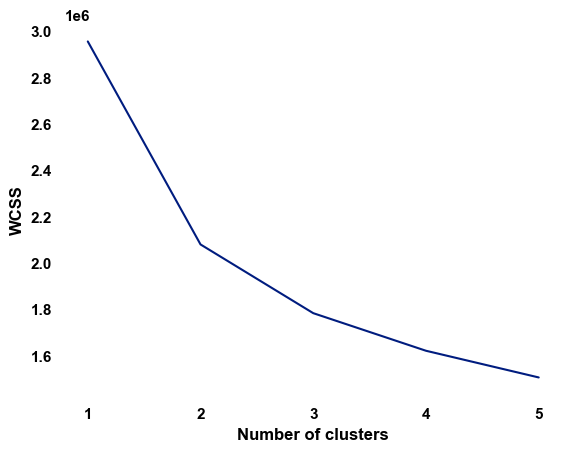

In [9]:
plt.plot(range(1,6),wcss)
plt.xticks(range(1,6))
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

#### <span style="color:Khaki;">Finding knee locator in the Elbow curve:

In [10]:
kl = KneeLocator(range(1,6),wcss,curve='convex',direction="decreasing")
optimal_k_wcss = kl.elbow
optimal_k_wcss

2

### <span style="color:Khaki;">Finding K value using silhouette score method:

In [11]:
silhouette_coefficients = []

for k in range(2,6):
    kmeans = KMeans(n_clusters=k,init='k-means++')
    kmeans.fit(df[final_eatures])
    score = silhouette_score(df[final_eatures],kmeans.labels_)
    silhouette_coefficients.append(score)
print(silhouette_coefficients)

[0.2575589464338113, 0.20448338299166974, 0.1749957021272057, 0.1599287109431195]


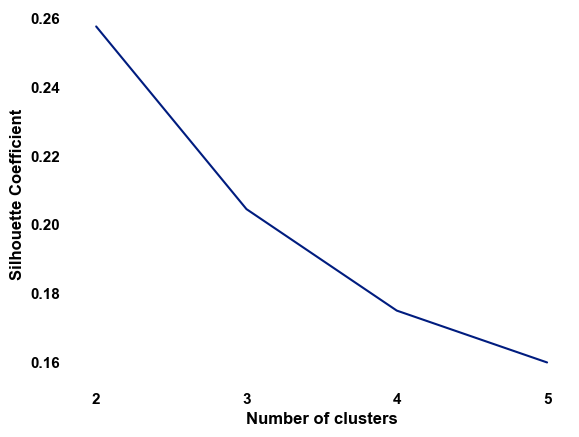

In [12]:
plt.plot(range(2,6),silhouette_coefficients)
plt.xticks(range(2,6))
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Coefficient')
plt.show()

In [13]:
optimal_k_silhouette = silhouette_coefficients.index(max(silhouette_coefficients)) + 2
print(f"Optimal number of clusters (Silhouette): {optimal_k_silhouette}")

Optimal number of clusters (Silhouette): 2


In [14]:
print(f"Optimal number of clusters (WCSS): {optimal_k_wcss}")
print(f"Optimal number of clusters (Silhouette): {optimal_k_silhouette}")

Optimal number of clusters (WCSS): 2
Optimal number of clusters (Silhouette): 2


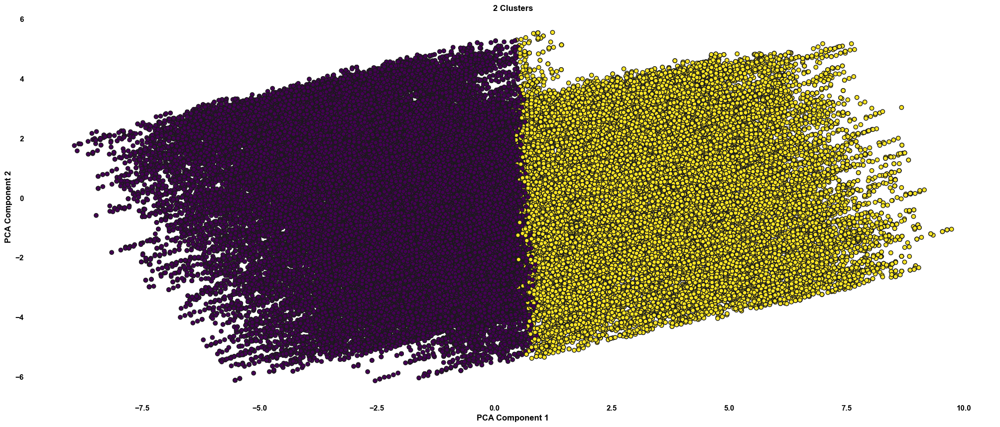

In [16]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Assuming x_train_scaled_df is your original dataset

# Reduce dimensions to 2D for visualization
pca = PCA(n_components=2)
x_pca = pca.fit_transform(df[final_eatures])

# Fit KMeans with 2 clusters
kmeans_2 = KMeans(n_clusters=2, init='k-means++')
labels_2 = kmeans_2.fit_predict(df[final_eatures])

# Plot the clusters
plt.figure(figsize=(25, 10))
plt.scatter(x_pca[:, 0], x_pca[:, 1], c=labels_2, cmap='viridis', marker='o', edgecolor='k')
plt.title('2 Clusters')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()

In [16]:
scales = {'std_scale' : StandardScaler(),
'mm_scale' : MinMaxScaler(feature_range=(0,1)),
'rob_scale' : RobustScaler()
}
scaled_dfs = {}
for scaler_name, scaler in scales.items():
    scaled_dfs[scaler_name] = scaler.fit_transform(df[final_eatures].values)
    print(scaler_name, '---', len(scaled_dfs[scaler_name]))
    
# print([scaler_name for scaler_name in scaled_dfs.keys()])
# print([scaler_df[1] for scaler_df in scaled_dfs.values()])

for scaler_name, scaled_df in scaled_dfs.items():
    print(scaler_name, scaled_df[:1])

std_scale --- 100000
mm_scale --- 100000
rob_scale --- 100000
std_scale [[-0.91343801 -0.74189873  0.19094616  1.27417057  1.64667727 -0.94783536
  -0.86396218  0.40945462]]
mm_scale [[0.27272727 0.36363636 0.44444444 1.         1.         0.27002413
  0.2921981  0.6       ]]
rob_scale [[-0.5        -0.33333333  0.33333333  1.          1.         -0.59248145
  -0.4958076   0.25      ]]


In [17]:
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans.fit(df[original_features])
df['Cluster'] = kmeans.predict(df[original_features])
s_s= silhouette_score(df[original_features], kmeans.labels_)
c_h_s= calinski_harabasz_score(df[original_features], kmeans.labels_)
d_b_s= davies_bouldin_score(df[original_features], kmeans.labels_)

In [18]:
print(s_s,c_h_s, d_b_s,)

0.45550417290114587 95057.18513830086 0.8133252878873116


df[original_features]
0.45550417290114587 95057.18513830086 0.8133252878873116

# <span style="color:Aqua;">Training DB Scan model:</span>


In [22]:
min_samples_range = range(2, 5)
list(min_samples_range)

[2, 3, 4]

In [23]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

def dbscan_grid_search(X, eps_range, min_samples_range):
    best_score = -1
    best_params = {}
    
    for eps in eps_range:
        for min_samples in min_samples_range:
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            labels = dbscan.fit_predict(X)
            
            # Skip if all points are noise (-1)
            if len(set(labels)) < 2:
                continue
            
            score = silhouette_score(X, labels)
            
            if score > best_score:
                best_score = score
                best_params = {'eps': eps, 'min_samples': min_samples}
    
    return best_params, best_score

# Define ranges to search
eps_range = np.arange(0.1, 2.0, 0.3)
min_samples_range = range(2, 5)

best_params, best_score = dbscan_grid_search(df[original_features], eps_range, min_samples_range)
print(f"Best parameters: {best_params}")
print(f"Best silhouette score: {best_score}")

Best parameters: {'eps': 1.9000000000000004, 'min_samples': 2}
Best silhouette score: -0.004675561463720598


In [27]:
df[original_features].shape

(100000, 14)

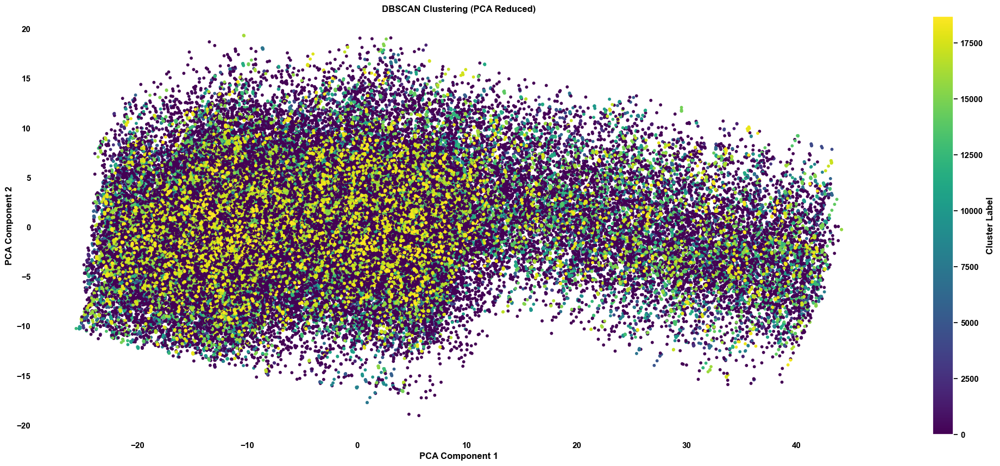

In [43]:
from sklearn.decomposition import PCA

dbscan = DBSCAN(eps=3, min_samples=3)
labels = dbscan.fit_predict(df[original_features])

pca = PCA(n_components=2)
pca_components = pca.fit_transform(df[original_features])

# Fit DBSCAN
dbscan = DBSCAN(eps=best_params['eps'], min_samples=best_params['min_samples'])
labels = dbscan.fit_predict(df[original_features])

# Plot the clusters
plt.figure(figsize=(25, 10))
plt.scatter(pca_components[:, 0], pca_components[:, 1], c=labels, cmap='viridis', s=10)
plt.title('DBSCAN Clustering (PCA Reduced)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.colorbar(label='Cluster Label')
plt.show()

In [44]:
df['Cluster_db'] = dbscan.fit_predict(df)

In [45]:
df.Cluster_db.value_counts()

Cluster_db
-1       82245
 6872        8
 172         8
 877         7
 4127        7
         ...  
 2867        2
 2865        2
 2864        2
 2861        2
 7582        2
Name: count, Length: 7584, dtype: int64

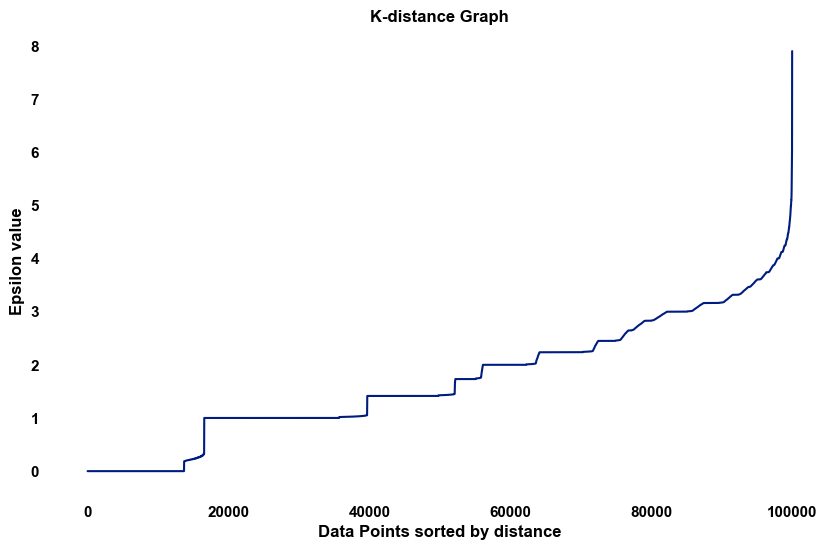

In [34]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
import matplotlib.pyplot as plt

# Fit NearestNeighbors model
neighbors = NearestNeighbors(n_neighbors=2)
neighbors_fit = neighbors.fit(df[original_features])
distances, indices = neighbors_fit.kneighbors(df[original_features])

# Sort the distances and plot
distances = np.sort(distances, axis=0)
distances = distances[:, 1]
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.xlabel('Data Points sorted by distance')
plt.ylabel('Epsilon value')
plt.title('K-distance Graph')
plt.show()

Your implementation looks good. Let's break down the evaluation metrics and the cluster summary to interpret the model's performance:

Evaluation Metrics Interpretation:
Silhouette Score:

Range: -1 to 1
Interpretation: Measures how similar an object is to its own cluster compared to other clusters.
1: Perfectly clustered.
0: Overlapping clusters.
-1: Mis-clustering.
Your Score: 0.403. This indicates a reasonable clustering performance. While it’s not extremely high, it suggests that your clusters are well-formed but may have some overlap.
Calinski-Harabasz Index:

Higher is better.
Measures the ratio of the sum of between-cluster dispersion and within-cluster dispersion.
Your Score: 100607.210. This is a very high value, indicating well-separated clusters with minimal dispersion within clusters.
Davies-Bouldin Index:

Range: 0 to ∞
Interpretation: Lower values indicate better clustering.
Measures the average similarity ratio of each cluster with its most similar cluster.
Your Score: 0.920. This is a relatively low value, indicating good clustering where clusters are distinct and well-separated.
Cluster Summary Interpretation:
The cluster summary gives you the mean values of each feature for each cluster. This helps in understanding the characteristics of each cluster.

For example, if you have two clusters (0 and 1), you might see something like:

python
Copy code
cluster_summary = df.groupby('Cluster').mean()
print(cluster_summary)
How to Interpret Each Cluster:
Compare Feature Means:

Look at the mean values of each feature for both clusters.
Identify which features have significantly different means between clusters.
Characterize Clusters:

Based on the mean values, describe the characteristics of each cluster.
For example, Cluster 0 might have a higher average credit_score and annual_income_boxcox, indicating this cluster consists of customers with higher credit scores and incomes.
Conversely, Cluster 1 might have higher num_of_delayed_payment and outstanding_debt_square, indicating higher-risk customers with more payment delays and outstanding debts.
Domain Knowledge:

Use your domain knowledge to make sense of these clusters.
For instance, in a banking context, one cluster might represent low-risk customers (high credit score, low outstanding debt), and the other cluster might represent high-risk customers (low credit score, high outstanding debt).
Example Summary:
Assume you have a summary like this:

Feature	Cluster 0	Cluster 1
num_bank_accounts	3.5	2.1
num_credit_card	4.0	1.8
credit_score	750	600
num_of_delayed_payment	1.2	5.4
annual_income_boxcox	10.5	7.2
Cluster 0: Customers with more bank accounts, credit cards, higher credit scores, fewer delayed payments, and higher incomes.
Cluster 1: Customers with fewer bank accounts and credit cards, lower credit scores, more delayed payments, and lower incomes.
Next Steps:
Further Analysis: Dive deeper into each cluster to understand the specific characteristics and potential strategies for each customer segment.
Visualization: Visualize the clusters using PCA or t-SNE to see the separation in a 2D or 3D space.
Business Strategy: Develop tailored strategies for each cluster, such as offering premium services to Cluster 0 and financial rehabilitation programs to Cluster 1.
If you need more details on any specific part or further analysis, feel free to ask!

Claude AI

Based on the information you've provided, let's interpret the outputs to assess the model's performance:

Cluster Summary:
The cluster summary shows the mean values of each feature for the two clusters. Some key differences:


Cluster 0 generally has higher values for credit-related features like num_bank_accounts, num_credit_card, num_of_loan, delay_from_due_date, and num_of_delayed_payment.
Cluster 1 has higher values for income-related features like annual_income_boxcox, monthly_inhand_salary_boxcox, and disposable_income.
Cluster 1 also has a higher credit_score and savings_rate_rec.

This suggests Cluster 0 might represent higher-risk customers with more credit products and delayed payments, while Cluster 1 might represent lower-risk customers with higher incomes and better financial health.

Cluster Visualization:
The PCA plot shows a clear separation between the two clusters, which is a good sign. The clusters are distinctly visible, indicating that the algorithm has found meaningful patterns in the data.
Silhouette Score: 0.4030


Range: -1 to 1
Interpretation: A score of 0.4030 is moderate to good. It indicates that, on average, data points are well-matched to their own clusters and poorly-matched to neighboring clusters.


Calinski-Harabasz Index: 100607.21


Higher values indicate better-defined clusters
Interpretation: This high value suggests well-defined clusters. However, without context from other models, it's hard to say if this is exceptionally high.


Davies-Bouldin Index: 0.9204


Lower values indicate better clustering
Interpretation: This value is reasonably low, suggesting good cluster separation.

Overall interpretation:

The model has found two distinct clusters with clear differences in financial behavior and status.
The separation between clusters is good, as evidenced by the PCA plot and the validation metrics.
The silhouette score suggests moderate to good cluster cohesion and separation.
The high Calinski-Harabasz index and low Davies-Bouldin index further support that the clustering is meaningful.

To further validate the model:

Perform statistical tests (e.g., t-tests) on key features to confirm significant differences between clusters.
Validate the business interpretation of the clusters with domain experts.
Consider trying other clustering algorithms (e.g., hierarchical clustering) to see if they produce similar results.
If possible, use external validation by checking if the clusters align with any known customer segments or outcomes.

The model appears to be performing well, but remember that the true value of clustering comes from its practical application and insights generated for your specific business context.